In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import cv2 as cv
import os
import torch
from IPython.display import Image

# **Prepare dataset**


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/datasets.zip' -d '/content'

# **Analyze and visualize dataset**

In [19]:
LABELS = ['Prohibitory', 'Danger', 'Mandatory', 'Other']

**Example data**

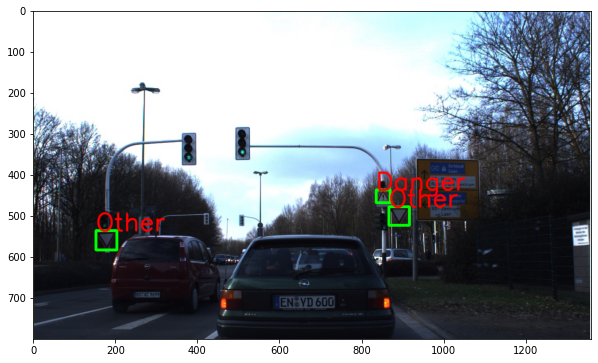

In [20]:
img_ = cv.imread('/content/datasets/traffic_sign_data_4/images/all/00771.jpg')
img_ = cv.cvtColor(img_, cv.COLOR_BGR2RGB)

with open('/content/datasets/traffic_sign_data_4/labels/all/00771.txt') as f:
      while True:
        line = f.readline()
        info = line.strip().split(' ')

        if not line:
            break    

        cls = int(info[0])
        cls_name = LABELS[cls]

        x_center = float(info[1]) * 1360
        y_center = float(info[2]) * 800
        w_ = float(info[3]) * 1360
        h_ = float(info[4]) * 800
        x_min = int(x_center - w_/2)
        y_min = int(y_center - h_/2)
        x_max = int(x_center + w_/2)
        y_max = int(y_center + h_/2)

        cv.rectangle(img_, (x_min, y_min), (x_max, y_max), (0, 255, 0), 5)
        cv.putText(img_ ,cls_name, (x_min, y_min), cv.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3, cv.LINE_AA)

plt.figure(figsize=(10, 10))
plt.imshow(img_)

In [ ]:
data_labels = {}
num_of_labels_pimg =  {}
num_img = 0
wh_box = []
xy_box = []

objects = []
classes = []
w = 1360
h = 800

In [ ]:
for i in range(len(LABELS)):
  cls_name = LABELS[i]
  data_labels[cls_name] = 0

for file in os.listdir('/content/datasets/traffic_sign_data_4/labels/all'):
  num_img += 1
  if file.endswith(".txt"):
    img = cv.imread('/content/datasets/traffic_sign_data_4/images/all/{}.jpg'.format(file[0:5]))

    with open('/content/datasets/traffic_sign_data_4/labels/all/{}'.format(file)) as f:
      total_object = 0

      while True:
        line = f.readline()
        info = line.strip().split(' ')

        if not line:
            break  

        total_object += 1  

        cls = int(info[0])
        cls_name = LABELS[cls]
        data_labels[cls_name] += 1

        classes.append(cls_name)
        x_center = float(info[1]) * 1360
        y_center = float(info[2]) * 800
        w_ = float(info[3]) * 1360
        h_ = float(info[4]) * 800
        x_min = int(x_center - w_/2)
        y_min = int(y_center - h_/2)
        x_max = int(x_center + w_/2)
        y_max = int(y_center + h_/2)

        obj = img[y_min:y_max, x_min:x_max]
        obj = cv.cvtColor(obj, cv.COLOR_BGR2GRAY)
        obj = cv.resize(obj, (50, 50))
        
        objects.append(obj)
      
        wh_box.append([float(info[3]), float(info[4])])
        xy_box.append([float(info[1]), float(info[2])])

      if str(total_object) in num_of_labels_pimg:
        num_of_labels_pimg[str(total_object)] += 1
      else:
        num_of_labels_pimg[str(total_object)] = 0
        num_of_labels_pimg[str(total_object)] += 1

**Object Distribution**

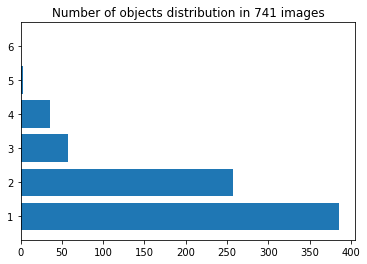

In [ ]:
y_pos = np.arange(len(num_of_labels_pimg))
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.barh(y_pos,list(num_of_labels_pimg.values()))
ax.set_yticks(y_pos)
ax.set_yticklabels(list(num_of_labels_pimg.keys()))
ax.set_title("Number of objects distribution in {} images".format(num_img))
plt.show()

**Class distribution**

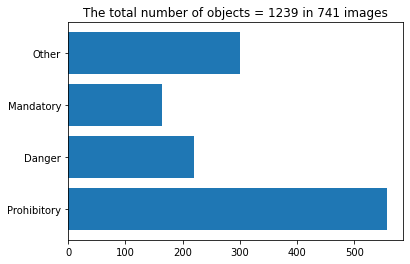

In [ ]:
y_pos = np.arange(len(data_labels))
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.barh(y_pos,list(data_labels.values()))
ax.set_yticks(y_pos)
ax.set_yticklabels(list(data_labels.keys()))
ax.set_title("The total number of objects = {} in {} images".format(
    np.sum(list(data_labels.values())),num_img
))
plt.show()

**Object size Distribution**

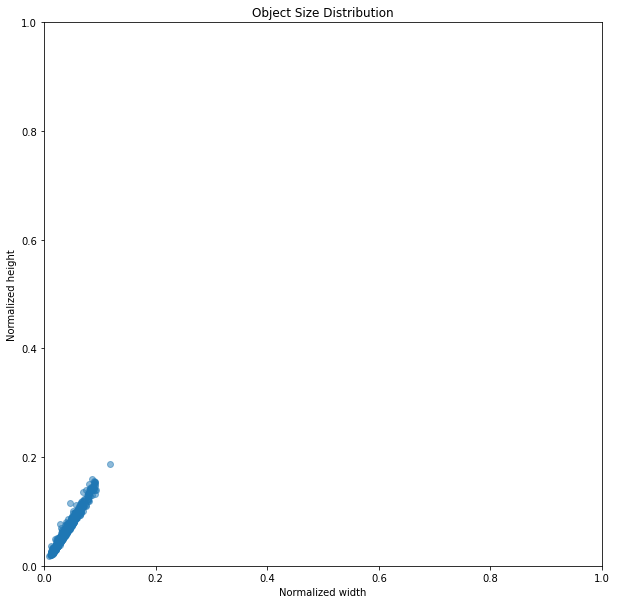

In [ ]:
wh_box = np.array(wh_box)
plt.figure(figsize=(10, 10))
plt.title("Object Size Distribution")
plt.xlabel("Normalized width")
plt.ylabel("Normalized height")
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.scatter(wh_box[:, 0], wh_box[:, 1], alpha=0.5)
plt.show()

**Object location Distribution**

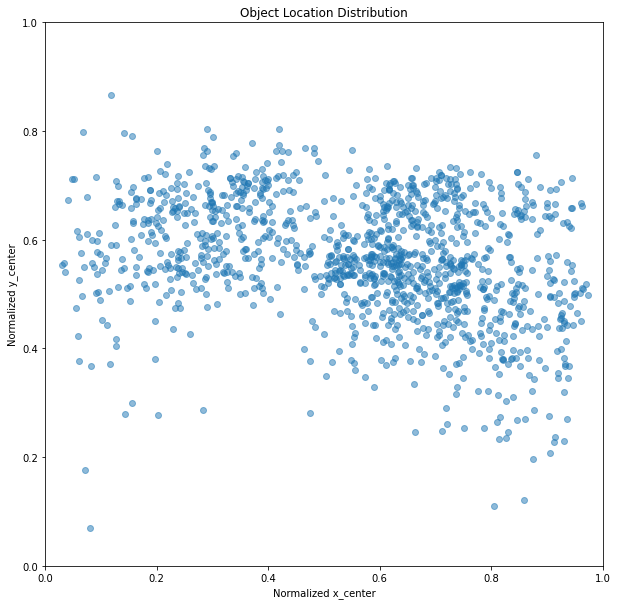

In [ ]:
xy_box = np.array(xy_box)
plt.figure(figsize=(10, 10))
plt.title("Object Location Distribution")
plt.xlabel("Normalized x_center")
plt.ylabel("Normalized y_center")
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.scatter(xy_box[:, 0], xy_box[:, 1], alpha=0.5)
plt.show()

In [ ]:
objects = np.array(objects)
objects = objects.reshape(objects.shape[0], -1)
objects.shape

(1239, 2500)

**t-SNE**

In [ ]:
tsne = manifold.TSNE(n_components=2, random_state=42)
# fit and transform
tsne_ = tsne.fit_transform(objects)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [ ]:
cps_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((tsne_, 
                                            classes)))
cps_df['CP1'] = cps_df['CP1'].astype(float)
cps_df['CP2'] = cps_df['CP2'].astype(float)
cps_df

,CP1,CP2,target
0,-12.322660,-25.193708,Danger
1,5.119097,-20.864943,Prohibitory
2,-14.353638,-11.182479,Prohibitory
3,18.227064,25.048824,Prohibitory
4,-46.889698,20.382933,Other
...,...,...,...
1234,-20.010778,17.095920,Prohibitory
1235,8.485594,1.505247,Mandatory
1236,10.377962,2.604874,Other
1237,-12.986510,-2.026091,Prohibitory


/usr/local/lib/python3.8/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


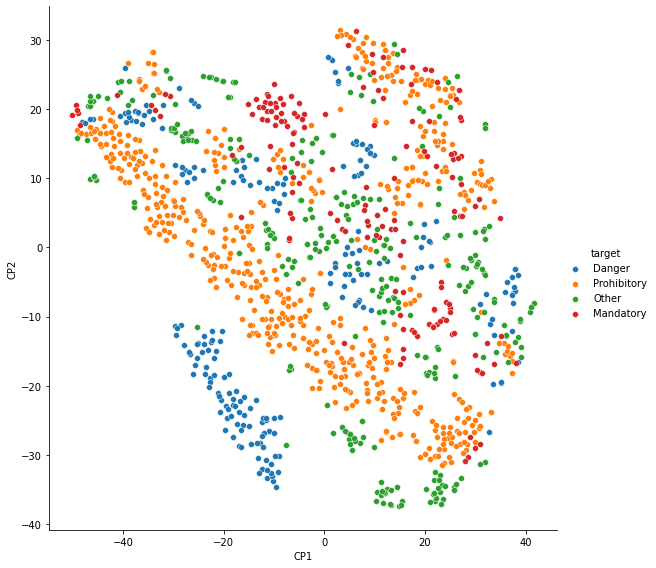

In [ ]:
grid = sns.FacetGrid(cps_df, hue="target", size=8)
grid.map_dataframe(sns.scatterplot, x="CP1", y="CP2").add_legend()

# **YOLO V5**

In [4]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15002, done.
remote: Total 15002 (delta 0), reused 0 (delta 0), pack-reused 15002
Receiving objects: 100% (15002/15002), 14.08 MiB | 26.16 MiB/s, done.
Resolving deltas: 100% (10291/10291), done.


In [5]:
%cd yolov5 
!pip install -qr requirements.txt

/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import cv2
# Image shape in Training
image = cv2.imread('/content/datasets/traffic_sign_data_33/images/train/00000.jpg')
height = np.size(image, 0)
width = np.size(image, 1)
print ("shape of the training image {}, {}".format(height, width))
# Image shape in validation
image = cv2.imread('/content/datasets/traffic_sign_data_33/images/val/00004.jpg')
height = np.size(image, 0)
width = np.size(image, 1)
print ("shape of the validation image {}, {}".format(height, width))

shape of the training image 800, 1360
shape of the validation image 800, 1360


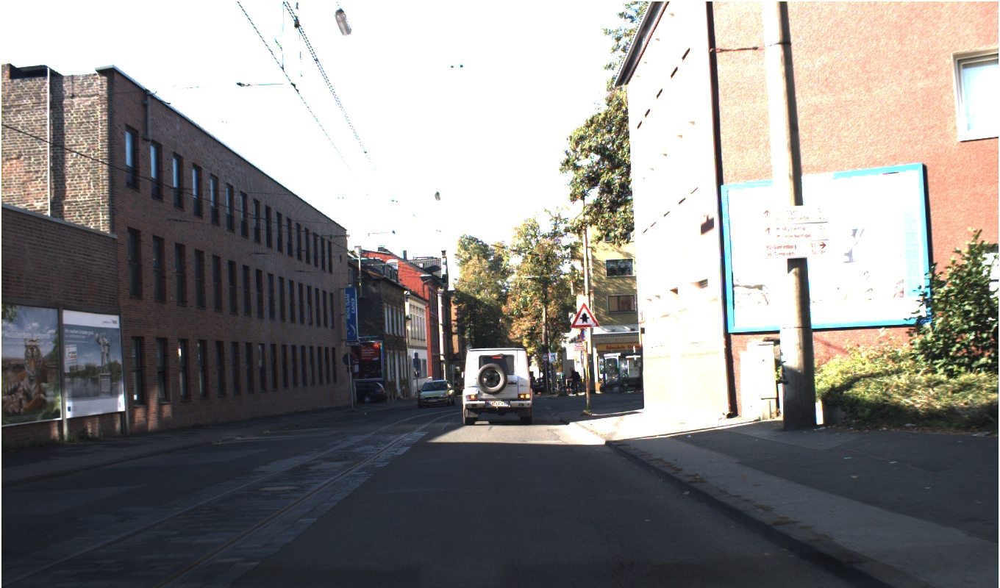

In [ ]:
Image(filename='/content/datasets/traffic_sign_data_33/images/train/00000.jpg', width=800) 

In [6]:
%%writefile /content/yolov5/data/traffic_sign_data.yaml 

# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /content/datasets/traffic_sign_data_4 # dataset root dir
train: images/train/ # train images (relative to 'path')
val: images/val/ # val images (relative to 'path')
test: images/test/ # test images (optional)

# Classes
nc: 4  # number of classes

# class names
names: ['Prohibitory', 'Danger', 'Mandatory', 'Other']

Writing /content/yolov5/data/traffic_sign_data.yaml


In [ ]:
!python train.py --img 1360 --batch 16 --epochs 30 --data traffic_sign_data.yaml --weights yolov5s.pt --cache

      28/29      14.2G    0.01611   0.007397   0.001866         10       1376: 100% 40/40 [00:35<00:00,  1.11it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:01<00:00,  2.28it/s]
                   all        111        184      0.976      0.977      0.983      0.833

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      29/29      14.2G    0.01573   0.007462   0.001879         17       1376: 100% 40/40 [00:35<00:00,  1.12it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:01<00:00,  2.29it/s]
                   all        111        184       0.98      0.977      0.982      0.841

30 epochs completed in 0.317 hours.
Optimizer stripped from runs/train/exp/weights/last.pt, 14.8MB
Optimizer stripped from runs/train/exp/weights/best.pt, 14.8MB

Validating runs/train/exp/weights/best.pt...
Fusing layers... 
Model summary: 157 layers, 7020913 par

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train/
     

Output hidden; open in https://colab.research.google.com to view.

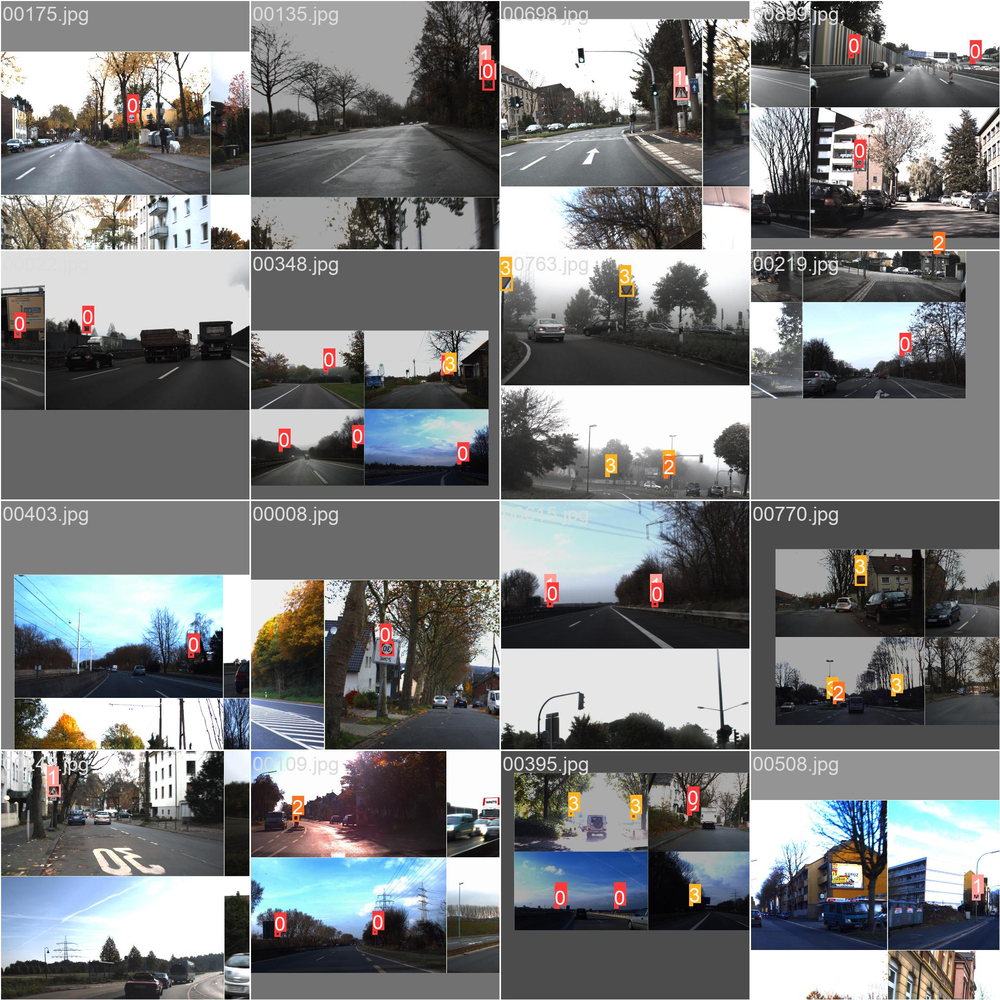

In [ ]:
Image(filename='/content/yolov5/runs/train/exp/train_batch0.jpg', width=800)

In [ ]:
!python detect.py  --source /content/datasets/traffic_sign_data_4/images/val/00672.jpg --weights runs/train/exp/weights/best.pt --conf 0.25 --save-txt


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/traffic_sign_data_4/images/val/00672.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/datasets/traffic_sign_data_4/images/val/00672.jpg: 384x640 3 Others, 12.2ms
Speed: 0.6ms pre-process, 12.2ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4
1 labels saved to runs/detect/exp4/labels


In [9]:
!python val.py --data data/traffic_sign_data.yaml --img 1360 --task val --weights /content/best.pt 

val: data=data/traffic_sign_data.yaml, weights=['/content/best.pt'], batch_size=32, imgsz=1360, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size 1360 must be multiple of max stride 32, updating to 1376
100% 755k/755k [00:00<00:00, 17.2MB/s]
val: Scanning /content/datasets/traffic_sign_data_4/labels/val... 111 images, 0 backgrounds, 0 corrupt: 100% 111/111 [00:00<00:00, 1032.83it/s]
val: New cache created: /content/datasets/traffic_sign_data_4/labels/val.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/4 [00:00<?, ?it/s]tcmalloc: large alloc 1199570944 by

In [17]:
!python detect.py  --source /content/datasets/traffic_sign_data_4/images/test/00099.jpg --weights /content/best.pt --conf 0.25 --save-txt

detect: weights=['/content/best.pt'], source=/content/datasets/traffic_sign_data_4/images/test/00099.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CPU

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/datasets/traffic_sign_data_4/images/test/00099.jpg: 384x640 1 Danger, 253.6ms
Speed: 0.8ms pre-process, 253.6ms inference, 1.1ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp4
1 labels saved to runs/detect/exp4/labels


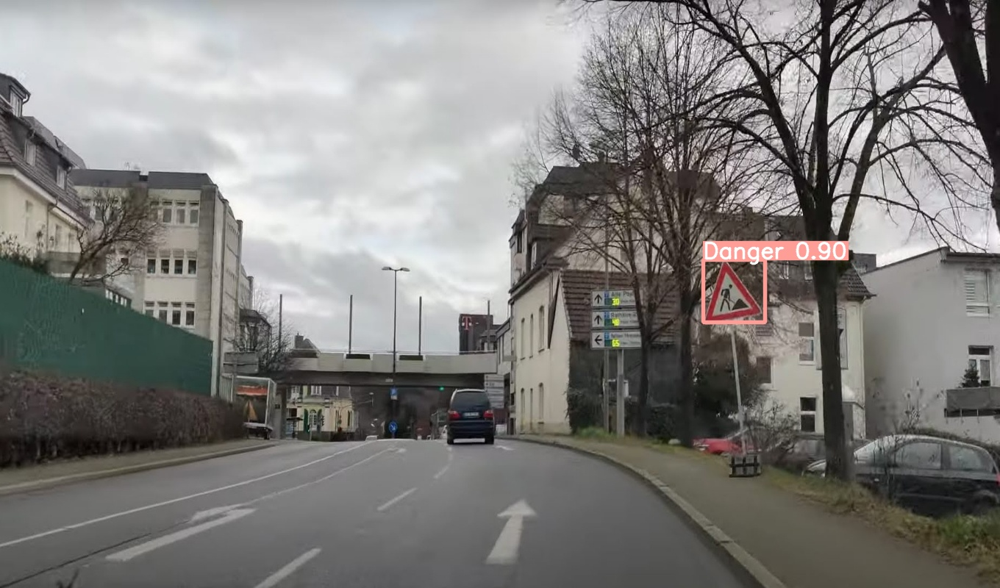

In [18]:
Image(filename='/content/yolov5/runs/detect/exp4/00099.jpg', width=800)

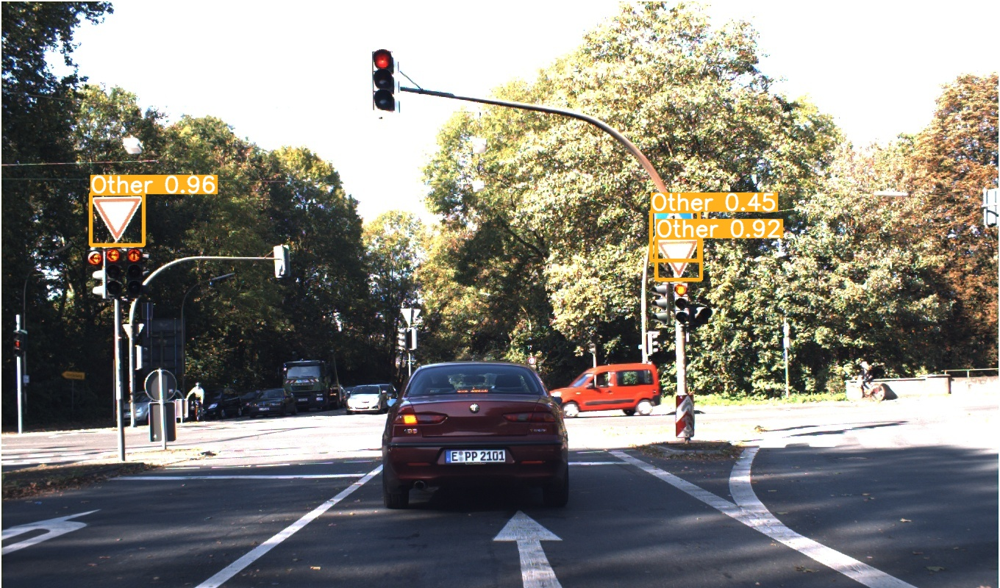

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp4/00672.jpg', width=800)

In [ ]:
!python detect.py  --source /content/datasets/traffic_sign_data_4/images/val/00216.jpg --weights /content/best.pt --conf 0.25 --save-txt

detect: weights=['/content/best.pt'], source=/content/datasets/traffic_sign_data_4/images/val/00216.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/datasets/traffic_sign_data_4/images/val/00216.jpg: 384x640 2 Prohibitorys, 20.4ms
Speed: 0.5ms pre-process, 20.4ms inference, 1.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3
1 labels saved to runs/detect/exp3/labels


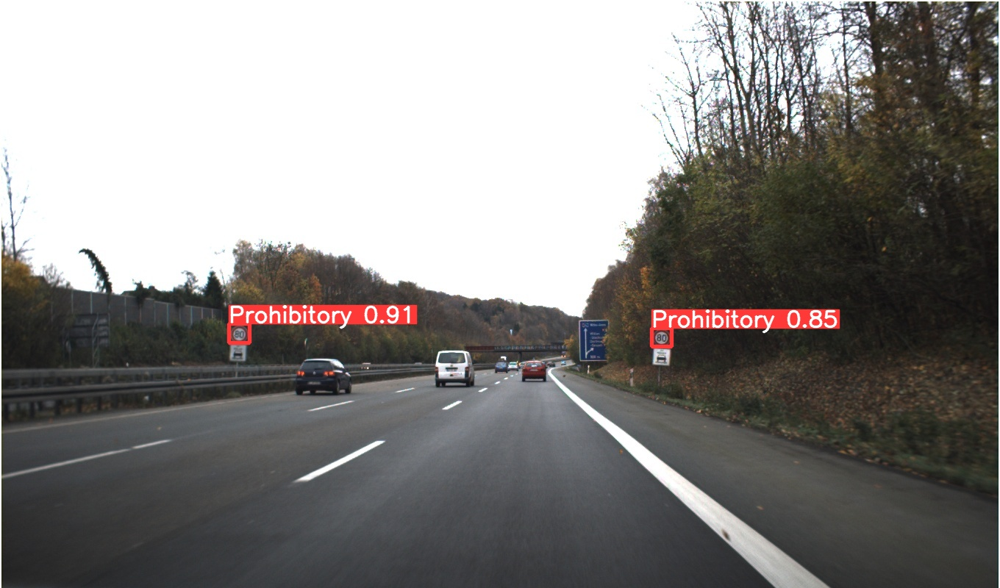

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp3/00216.jpg', width=800)

In [ ]:
!python detect.py  --source /content/test1.mp4 --weights /content/best.pt --conf 0.25 --save-txt

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>